In [4]:
import pandas as pd
import numpy as np

In [5]:
data = pd.read_csv("reddit_worldnews_start_to_2016-11-22.csv")

In [41]:
import random 
random.seed(30)
small_sample = data.sample(n =5000).reset_index(drop=True)

In [42]:
titles = small_sample["title"].values

# Preprocessing

In [43]:
# Preprocess the reviews (tokenizing, lemmatization, removing stopwords)
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import string

stop_words = set(stopwords.words('english'))

lemmatizer = WordNetLemmatizer()

def preprocessing(titles):
    filtered_titles = []
    for title in titles:
        title = title.lower()
        token_list = word_tokenize(title) # Tokenize
        filtered_token = [t for t in token_list if not t in stop_words] # Remove stopwords
        for i in range(len(filtered_token)):
            filtered_token[i] = lemmatizer.lemmatize(filtered_token[i]).strip(string.punctuation) # Lemmatization
        filtered_titles.append(" ".join(filtered_token))
    return filtered_titles

In [83]:
filtered_corpus = preprocessing(titles)

In [45]:
len(filtered_corpus)

5000

# Word Count

In [46]:
import sklearn
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

filtered_corpus = preprocessing(titles)
vectorizer = CountVectorizer()

# vectorize the corpus and generate similarity matrix
vector = vectorizer.fit_transform(filtered_corpus)

In [47]:
from sklearn.decomposition import PCA
features=vector.toarray()

pca = PCA(n_components=2)

pca_fit= pca.fit_transform(features)

In [48]:
explained_variance = np.var(pca_fit, axis=0)
explained_variance_ratio = explained_variance / np.sum(explained_variance)

In [49]:
explained_variance_ratio

array([0.50311257, 0.49688743])

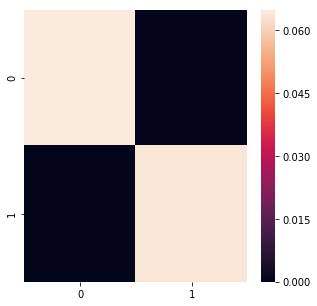

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
covariances = pd.DataFrame(np.cov(pca_fit.transpose()))
plt.rcParams["figure.figsize"] = (5,5)
sns.heatmap(covariances)

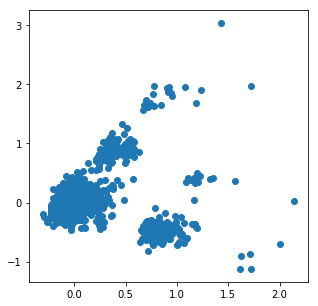

In [51]:
plt.scatter(pca_fit[:,0], pca_fit[:, 1])
reduced_features_df = pd.DataFrame(pca_fit, columns=["x1", "x2"])
reduced_features_df["text"] = titles

In [54]:
#cleaning titles since matplotlib cannot display $$ properly
titles_clean=[i.replace('$$','$') for i in titles]

' [U+d]
  MathTextWarning)
/anaconda3/lib/python3.6/site-packages/matplotlib/mathtext.py:850: MathTextWarning: Substituting with a dummy symbol.
  warn("Substituting with a dummy symbol.", MathTextWarning)


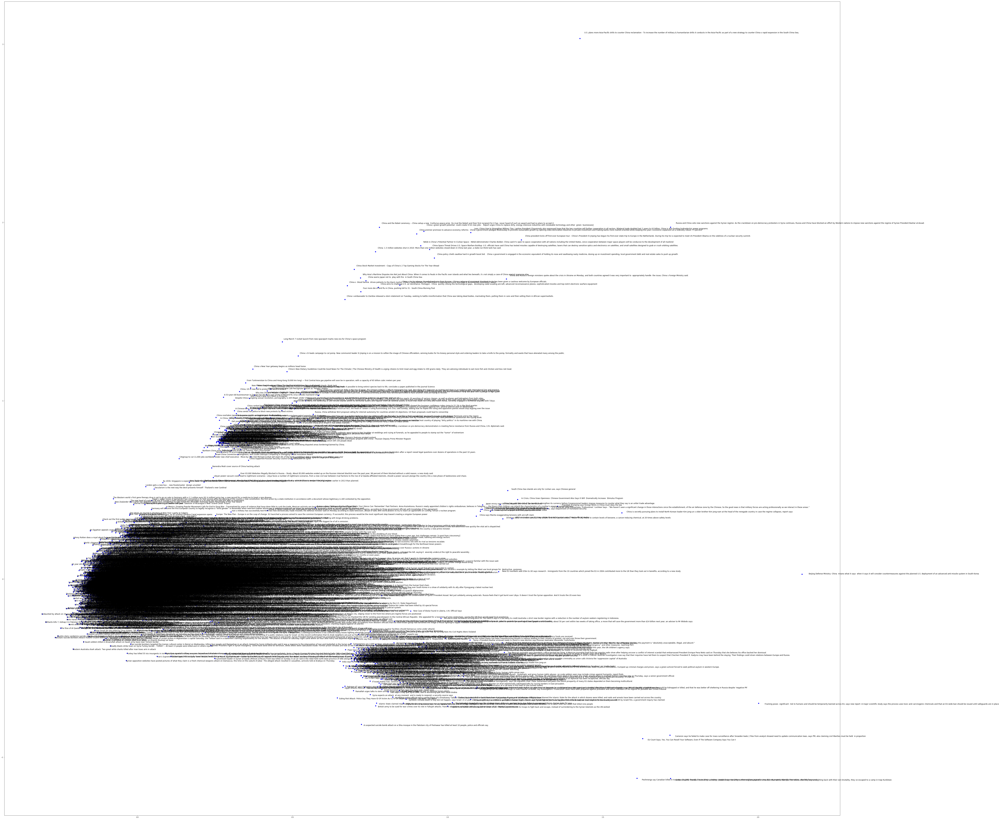

In [55]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (100,100)

for i, vector in enumerate(pca_fit):
    x = vector[0]
    y = vector[1]
    plt.plot(x,y, 'bo')
    plt.text(x * (1 + 0.01), y * (1 + 0.01) , titles_clean[i], fontsize=12)

# Clustering

In [59]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4)
cluster_assignments = kmeans.fit_predict(pca_fit)

color_map = {
    0: "r",
    1: "b",
    2: "g",
    3: "y"
}

plt.rcParams["figure.figsize"] = (200,100)

for i, vector in enumerate(pca_fit):
    x = vector[0]
    y = vector[1]
    plt.plot(x,y, 'bo', c=color_map[cluster_assignments[i]])
    plt.text(x * (1 + 0.01), y * (1 + 0.01) , titles_clean[i], fontsize=12)

' [U+d]
  MathTextWarning)
/anaconda3/lib/python3.6/site-packages/matplotlib/mathtext.py:850: MathTextWarning: Substituting with a dummy symbol.
  warn("Substituting with a dummy symbol.", MathTextWarning)


# TF-IDF

In [ ]:
import sklearn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

filtered_corpus = preprocessing(titles)
vectorizer = TfidfVectorizer(ngram_range=(1,2),
                             token_pattern=r'\b[a-zA-Z]{3,}\b',
                             max_df = 0.4)

# vectorize the corpus and generate similarity matrix
vector = vectorizer.fit_transform(filtered_corpus)

# Word embeddings

In [ ]:
# load in spacy
import en_core_web_md
import spacy
from scipy.spatial.distance import cosine
nlp = en_core_web_md.load()

In [ ]:
vector=[nlp(i) for i in filtered_corpus]

# GloVe

In [61]:
from gensim.scripts.glove2word2vec import glove2word2vec
glove_input_file = 'glove.6B.100d.txt'
word2vec_output_file = 'glove.6B.100d.txt.word2vec'
glove2word2vec(glove_input_file, word2vec_output_file)

(400000, 100)

In [62]:
from gensim.models import KeyedVectors
# load the Stanford GloVe model
filename = 'glove.6B.100d.txt.word2vec'
model = KeyedVectors.load_word2vec_format(filename, binary=False)

In [84]:
filtered_corpus=[sent.replace('-',' ') for sent in filtered_corpus]

In [92]:
#averaging word vectors as sentence vectors
vectors=[]
for sentence in filtered_corpus:
    running_total = np.zeros(100)
    for i in range(0,len(running_total)):
        for token in sentence.split():
            try:
                running_total[i] += model.wv[token][i] # add the word embeddings to the running total
            except:
                running_total[i] += random.randint(0,1) #handles out-of-vocabulary issue
    # divide by the total number of words in sentence
    vectors.append(running_total / len(sentence.split()))

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).
  


In [94]:
len(vectors)

5000